In [1]:
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


In [2]:
price_history = pd.read_excel('okomu_large.xlsx')

In [3]:
price_history_df = pd.DataFrame(price_history)

In [4]:
price_history_df.head(5)

,Exchange Date,Close,Net,%Chg,Open,Low,High,Volume,Turnover - NGN,Flow
0,2017-01-03,40.17,NaN,NaN,NaN,NaN,NaN,11642.0,487730.0,0.0
1,2017-01-04,40.17,0.0,0.0,NaN,NaN,NaN,247329.0,9986380.0,NaN
2,2017-01-05,40.17,0.0,0.0,NaN,NaN,NaN,51330.0,2100560.0,NaN
3,2017-01-06,40.17,0.0,0.0,NaN,NaN,NaN,46256.0,1916130.0,NaN
4,2017-01-09,40.17,0.0,0.0,NaN,NaN,NaN,96200.0,4055480.0,NaN


In [7]:
price_history_df['Date'] = pd.to_datetime(price_history_df['Exchange Date'])

In [8]:
time_elapsed = (price_history_df['Exchange Date'].iloc[-1] - price_history_df['Exchange Date'].iloc[0]).days
#time_elapsed

In [9]:
#Current price / first record (i.e price at beginning of 2017)
#provides us with the total growth %
total_growth = (price_history_df['Close'].iloc[-1] / price_history_df['Close'].iloc[1])
print(total_growth)

4.1075429424943986


In [10]:
#Next, we want to annualize this percentage
#First, we convert our time elapsed to the # of years elapsed
number_of_years = time_elapsed / 365.0
#Second, we can raise the total growth to the inverse of the # of years
#(e.g. ~1/10 at time of writing) to annualize our growth rate
cagr = total_growth ** (1/number_of_years) - 1

#Now that we have the mean annual growth rate above,
#we'll also need to calculate the standard deviation of the
#daily price changes
std_dev = price_history_df['Close'].pct_change().std()

#Next, because there are roughy ~#248 trading days in a year in the NGX,
#we'll need to scale this by an annualization factor
#reference: https://www.fool.com/knowledge-center/how-to-calculate-annualized-volatility.aspx

number_of_trading_days = 248
std_dev = std_dev * math.sqrt(number_of_trading_days)

#From here, we have our two inputs needed to generate random
#values in our simulation
print ("cagr (mean returns) : ", str(round(cagr,4)))
print ("std_dev (standard deviation of return : )", str(round(std_dev,4)))

cagr (mean returns) :  0.2659
std_dev (standard deviation of return : ) 0.3333


In [11]:
def stock_monte_carlo(start_price,days,mu,sigma):
    price=np.zeros(days)
    price[0] = start_price
    
    shock = np.zeros(days)
    drift = np.zeros(days)
    
    for x in range(1,days):
        shock[x] =np.random.normal(loc=mu*dt, scale=sigma*np.sqrt(dt))
        drift[x] = mu *dt
        price[x] = price[x-1] + (price[x-1] *(drift[x] + shock[x]))
        
    return price

In [12]:
#define the days
days =248
dt =1/days
mu = price_history_df['Close'].pct_change().mean()
sigma = std_dev
print(days,dt,mu,sigma)

248 0.004032258064516129 0.0011741021432154274 0.33326934416126797


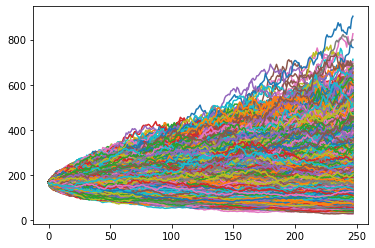

In [13]:
start_price = 165

for run in range(1000000):
    plt.plot(stock_monte_carlo(start_price, days, mu,sigma))
    

In [ ]:

#Now that we've created a single random walk above,
#we can simulate this process over a large sample size to
#get a better sense of the true expected distribution
number_of_trials = 1000000

#set up an additional array to collect all possible
#closing prices in last day of window.
#We can toss this into a histogram
#to get a clearer sense of possible outcomes
closing_prices = []

for i in range(number_of_trials):
    #calculate randomized return percentages following our normal distribution
    #and using the mean / std dev we calculated above
    daily_return_percentages = np.random.normal(cagr/number_of_trading_days, std_dev/math.sqrt(number_of_trading_days),number_of_trading_days)+1
    price_series = [price_history_df['Close'].iloc[-1]]

    for j in daily_return_percentages:
        #extrapolate price out for next year
        price_series.append(price_series[-1] * j)

    #append closing prices in last day of window for histogram
    #closing_prices.append(price_series[-1])

    #plot all random walks
    #plt.plot(price_series)

#plt.show()

#plot histogram
#plt.hist(closing_prices,bins=40)

#plt.show()

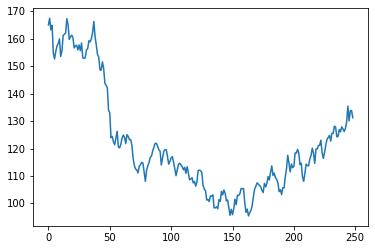

(array([1.14000e+02, 4.81600e+03, 3.60480e+04, 9.65080e+04, 1.50962e+05,
        1.70303e+05, 1.55451e+05, 1.24728e+05, 9.07000e+04, 6.20980e+04,
        4.06670e+04, 2.61860e+04, 1.61740e+04, 9.85300e+03, 5.97100e+03,
        3.70200e+03, 2.28000e+03, 1.36400e+03, 7.94000e+02, 4.75000e+02,
        3.10000e+02, 1.95000e+02, 1.22000e+02, 7.30000e+01, 4.30000e+01,
        1.40000e+01, 1.90000e+01, 1.40000e+01, 5.00000e+00, 4.00000e+00,
        3.00000e+00, 1.00000e+00, 1.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 1.00000e+00, 1.00000e+00]),
 array([  31.00396157,   58.62034413,   86.23672669,  113.85310925,
         141.46949181,  169.08587438,  196.70225694,  224.3186395 ,
         251.93502206,  279.55140462,  307.16778718,  334.78416974,
         362.4005523 ,  390.01693486,  417.63331742,  445.24969998,
         472.86608254,  500.48246511,  528.09884767,  555.71523023,
         583.33161279,  610.94799535,  638.56437791,  666.18076047,
      

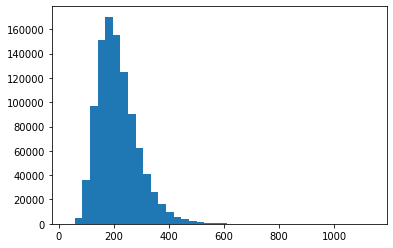

In [ ]:
plt.hist(closing_prices,bins=40)

In [ ]:
import plotly.express as px
px.histogram(closing_prices, nbins=100)

In [ ]:
closing_array = (np.array(closing_prices))

In [ ]:
165  * (1+0.1)

181.50000000000003

In [ ]:
#buys
buys  = ((closing_array > 181.5).sum())/1000000
print(buys) 

0.635218


In [ ]:
#sells
sells = ((closing_array < 165).sum())/1000000
print(sells)

0.263882


In [ ]:
hold = 1 - (new_buys + sells)
print(hold)

0.1549449999999999


In [ ]:
buys + sells + hold

1.0

In [ ]:
#percentage above target price
190.16
new_buys = ((closing_array >= 190.16).sum())/1000000
print(new_buys)

0.581173


In [ ]:
seventy_five_percentile = np.percentile(closing_array,75)
twenty_five_percentile = np.percentile(closing_array,25)
fifty_percentile = np.percentile(closing_array,50)

In [ ]:
print(seventy_five_percentile,twenty_five_percentile, fifty_percentile)

254.87710121068102 162.60896668778997 203.6526637254385


In [ ]:
closing_array.mean()

215.16537144113275

In [ ]:
closing_df = pd.DataFrame(closing_array)

In [ ]:
closing_df.to_csv('Finalized Jan 26 Simulation Data')